In [ ]:
import torch, torchvision, os, PIL, pdb
from torch import nn 
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.utils import make_grid
from tqdm.auto import tqdm
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

def show(tensor,num=25,wandbactive=0, name=''):
  data = tensor.detach().cpu()
  grid = make_grid(data[:num],nrow=5).permute(1,2,0)
  if(wandbactive==1):
    wandb.log({name: wandb.Image(grid.numpy().clip(0,1))})
    
  plt.imshow(grid.clip(0,1))
  plt.show()

In [ ]:
n_epochs = 10000
batch_size=128
lr=1e-4
z_dim = 200

device = 'cuda'

cur_step = 0
crit_cycles=5 #discriminator 5 times training genarator 1 times

gen_losses = []
crit_losses = []
show_step = 40
save_step = 40

wandbact = 1  # 1 yes track weights and biases 


In [ ]:
!pip install wandb -qqq
import wandb
wandb.login(key = '************************') 

wandb: Currently logged in as: frknrnn (use `wandb login --relogin` to force relogin)
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publically.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [ ]:
experiment_name = wandb.util.generate_id()

myrun = wandb.init(
    project ='wgan',
    group=experiment_name,
    config={
        "optimizer":"adam",
        "model":'wgan_gp',
        "epoch":"1000",
        "batch_size":"128"
            }
)

config = wandb.config


In [ ]:
print(experiment_name)

m57zl4s0


In [ ]:
# generator model 
class Generator(nn.Module):
  def __init__(self,z_dim=64,d_dim=16):
    super(Generator,self).__init__()
    self.z_dim = z_dim

    self.gen = nn.Sequential(
        # begin with a 1x1 image z_dim number of channels (200)
        nn.ConvTranspose2d(z_dim,d_dim*32,4,1,0), #4x4 (ch:200,512)
        nn.BatchNorm2d(d_dim*32),
        nn.ReLU(True),
        
        nn.ConvTranspose2d(d_dim*32,d_dim*16,4,2,1), # new size = 8x8 (ch: 512,256)
        nn.BatchNorm2d(d_dim*16),
        nn.ReLU(True),

        nn.ConvTranspose2d(d_dim*16,d_dim*8,4,2,1), # new size = 16x16 (ch: 256,128)
        nn.BatchNorm2d(d_dim*8),
        nn.ReLU(True),

        nn.ConvTranspose2d(d_dim*8,d_dim*4,4,2,1), # new size = 32x32 (ch: 128,64)
        nn.BatchNorm2d(d_dim*4),
        nn.ReLU(True),

        nn.ConvTranspose2d(d_dim*4,d_dim*2,4,2,1), # new size = 64x64 (ch: 64,32)
        nn.BatchNorm2d(d_dim*2),
        nn.ReLU(True),

        nn.ConvTranspose2d(d_dim*2,3,4,2,1), # new size = 128x128 (ch: 32,3)
        nn.Tanh() ## produce result in range -1 1


    )
  def forward(self,noise):
    x = noise.view(len(noise),self.z_dim,1,1)  # 128x200x1x1
    return self.gen(x)

def gen_noise(num,z_dim,device='cuda'):
  return torch.rand(num,z_dim,device=device) # 128x200



In [ ]:
## critic model
class Critic(nn.Module):
  def __init__(self,d_dim=16):
    super(Critic,self).__init__()

    self.crit = nn.Sequential(
        nn.Conv2d(3,d_dim,4,2,1), # 64x64 (ch: 3, 16)
        nn.InstanceNorm2d(d_dim),
        nn.LeakyReLU(0.2),

        nn.Conv2d(d_dim,d_dim*2,4,2,1), # 32x32 (ch: 16, 32)
        nn.InstanceNorm2d(d_dim*2),
        nn.LeakyReLU(0.2),

        nn.Conv2d(d_dim*2,d_dim*4,4,2,1), # 16x16 (ch: 32, 64)
        nn.InstanceNorm2d(d_dim*4),
        nn.LeakyReLU(0.2),

        nn.Conv2d(d_dim*4,d_dim*8,4,2,1), # 8x8 (ch: 64, 128)
        nn.InstanceNorm2d(d_dim*8),
        nn.LeakyReLU(0.2),

        nn.Conv2d(d_dim*8,d_dim*16,4,2,1), # 4x4 (ch: 128, 256)
        nn.InstanceNorm2d(d_dim*16),
        nn.LeakyReLU(0.2),

        nn.Conv2d(d_dim*16,1,4,1,0) # 1x1 (ch: 256, 1)

       


    )
  
  def forward(self,image):
    # image 128x3x128x128
    crit_pred = self.crit(image) #128x1x1x1
    return crit_pred.view(len(crit_pred),-1) ##128x1



  

In [ ]:
## Optional 

def init_weights(m):
  if isinstance(m,nn.Conv2d) or isinstance(m,nn.ConvTranspose2d):
    torch.nn.init.normal_(m.weight,0.0,0.02)
    torch.nn.init.constant_(m.bias,0)
  
  if isinstance(m,nn.BatchNorm2d):
    torch.nn.init.normal_(m.weight,0.0,0.02)
    torch.nn.init.constant_(m.bias,0)

#gen = gen.apply(init_weights)
#crit = crit.apply(init_weights)



In [ ]:
# load dataset
import gdown, zipfile


url = 'https://drive.google.com/uc?id=1cNIac61PSA_LqDFYFUeyaQYekYPc75NH'
path ='data/celeba'

download_path = f'{path}/img_align_celaba.zip'

if not os.path.exists(path):
  os.makedirs(path)

gdown.download(url,download_path,quiet=False)

with zipfile.ZipFile(download_path,'r') as ziphandler:
  ziphandler.extractall(path)

Downloading...
From: https://drive.google.com/uc?id=1cNIac61PSA_LqDFYFUeyaQYekYPc75NH
To: /content/data/celeba/img_align_celaba.zip
100%|██████████| 1.44G/1.44G [00:11<00:00, 126MB/s]


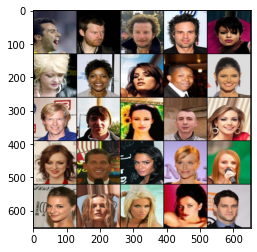

In [ ]:
class Dataset(Dataset):
  def __init__(self,path,size=128,lim=10000):
    self.sizes = [size,size]
    items,labels =[],[]

    for data in os.listdir(path)[:lim]:
      #path './data/celeva/img_align_celeba'
      #data '111.jpg'
      item = os.path.join(path,data)
      items.append(item)
      labels.append(data) # we dont need this

    self.items = items
    self.labels = labels

  def __len__(self):
    return len(self.items)
  
  def __getitem__(self,idx):
    data = PIL.Image.open(self.items[idx]).convert('RGB')
    data = np.asarray(torchvision.transforms.Resize(self.sizes)(data)) # 128x128x3
    data = np.transpose(data,(2,0,1)).astype(np.float32,copy=False)# 3x128x128 0 to 255
    data = torch.from_numpy(data).div(255) # tensor format and normalize 0-1
    return data, self.labels[idx]
  

## Dataset

data_path = './data/celeba/img_align_celeba'
ds = Dataset(data_path,size = 128, lim=10000)
      
## dataloader

dataloader = DataLoader(ds,batch_size=batch_size,shuffle=True)

##Models

gen = Generator(z_dim).to(device)
crit =  Critic().to(device)

## Optimizers

gen_opt = torch.optim.Adam(gen.parameters(),lr = lr,betas=(0.5,0.9))
crit_opt = torch.optim.Adam(crit.parameters(),lr=lr,betas=(0.5,0.9))

## Initializations
#gen = gen.apply(init_weights)
#crit = crit.apply(init_weights)

# wandb 
if(wandbact ==1 ):
  wandb.watch(gen,log_freq=100)
  wandb.watch(crit,log_freq=100)


x,y = next(iter(dataloader))
show(x)






In [ ]:
def get_gp(real,fake,crit,alpha,gamma=10):
  mix_images = real*alpha+fake*(1-alpha) #128x3x128x128
  mix_scores = crit(mix_images) # 128x1

  gradient = torch.autograd.grad(
      inputs = mix_images,
      outputs = mix_scores,
      grad_outputs = torch.ones_like(mix_scores),
      retain_graph = True,
      create_graph = True,
  )[0]  # 128x3x128x128
 
  gradient = gradient.view(len(gradient),-1)  #128x49152 
  gradient_norm = gradient.norm(2,dim=1) 

  gp = gamma*((gradient_norm-1)**2).mean()
  return gp

In [ ]:
## Save and load checkpoint

root_path ='./data/'

def save_checkpoint(name):
  torch.save({
      'epoch':epoch,
      'model_state_dict': gen.state_dict(),
      'optimizer_state_dict':gen_opt.state_dict()      
  }, f"{root_path}G-{name}.pkl")

  torch.save({
      'epoch':epoch,
      'model_state_dict': crit.state_dict(),
      'optimizer_state_dict':crit_opt.state_dict()      
  }, f"{root_path}C-{name}.pkl")

  print("save checkpoint")

def load_checkpoint(name):
  checkpoint = torch.load(f"{root_path}G-{name}.pkl")
  gen.load_state_dict(checkpoint['model_state_dict'])
  gen_opt.load_state_dict(checkpoint["optimizer_state_dict"])

  checkpoint = torch.load(f"{root_path}C-{name}.pkl")
  crit.load_state_dict(checkpoint['model_state_dict'])
  crit_opt.load_state_dict(checkpoint["optimizer_state_dict"])

  print("loaded checkpoint")

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint: 40 40
save checkpoint


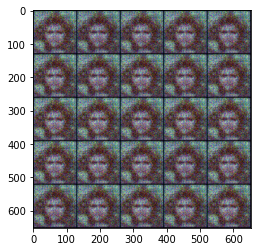

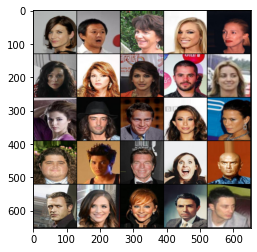

Epoch:0, Step: 40, Genarator loss: 62.65917978286743,critic loss: -12.89389905929566


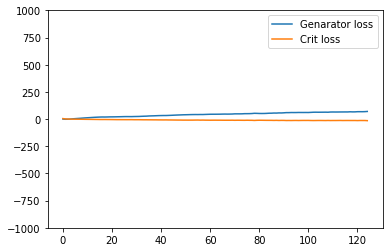

Saving checkpoint: 80 40
save checkpoint


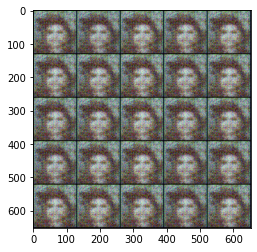

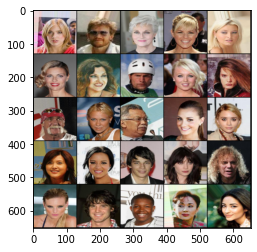

Epoch:0, Step: 80, Genarator loss: 74.03226089477539,critic loss: -14.19718818664551


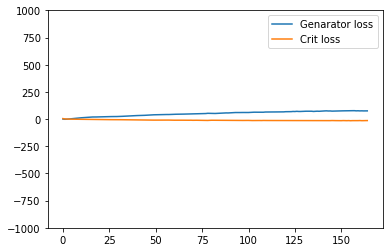

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint: 120 40
save checkpoint


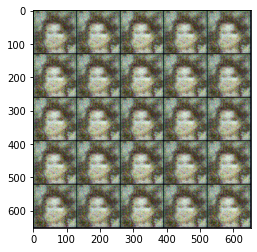

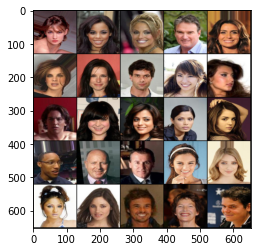

Epoch:1, Step: 120, Genarator loss: 80.5008062362671,critic loss: -14.718242378234866


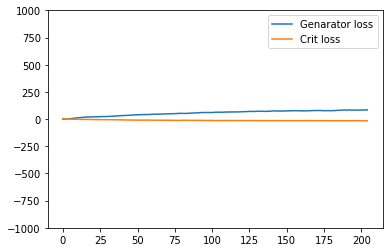

Saving checkpoint: 160 40
save checkpoint


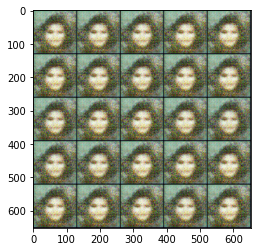

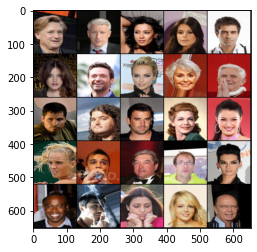

Epoch:1, Step: 160, Genarator loss: 80.9365156173706,critic loss: -15.477668762207035


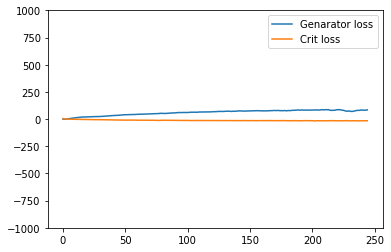

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint: 200 40
save checkpoint


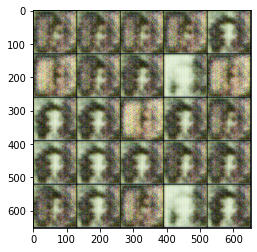

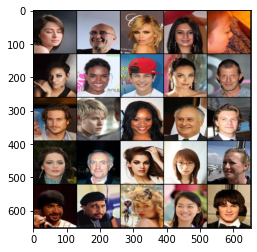

Epoch:2, Step: 200, Genarator loss: 65.89320104122162,critic loss: -12.915910749435422


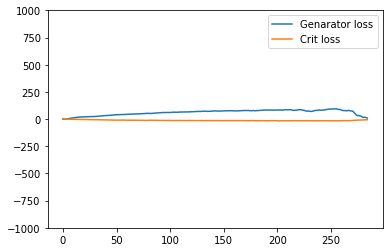

Saving checkpoint: 240 40
save checkpoint


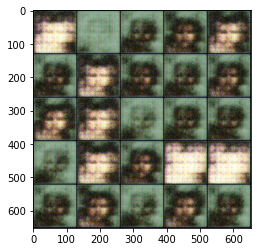

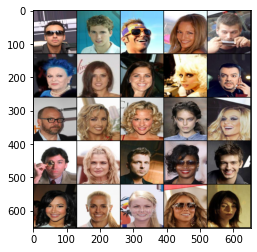

Epoch:2, Step: 240, Genarator loss: 12.823928450793028,critic loss: -6.475419931411745


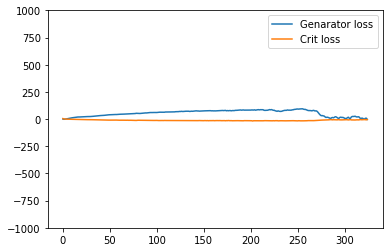

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint: 280 40
save checkpoint


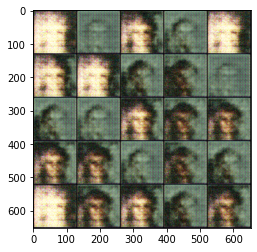

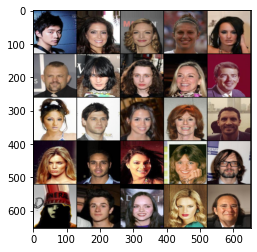

Epoch:3, Step: 280, Genarator loss: 5.209193464368582,critic loss: -5.5128201961517345


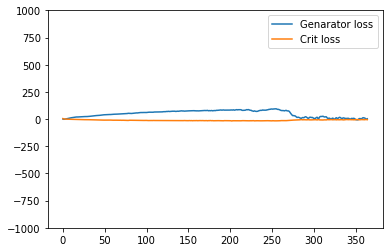

Saving checkpoint: 320 40
save checkpoint


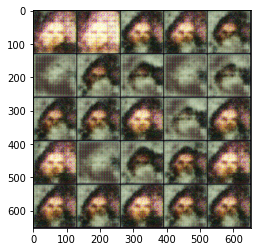

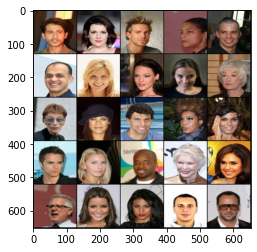

Epoch:3, Step: 320, Genarator loss: 1.1684584911912679,critic loss: -4.754337787628174


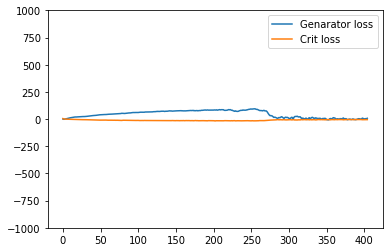

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint: 360 40
save checkpoint


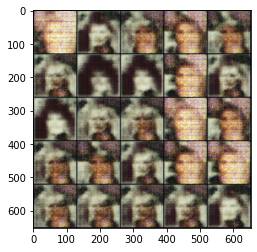

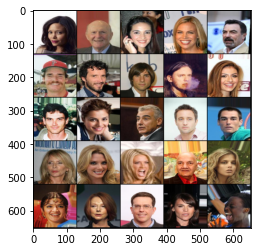

Epoch:4, Step: 360, Genarator loss: 10.588246978074313,critic loss: -5.344825038909912


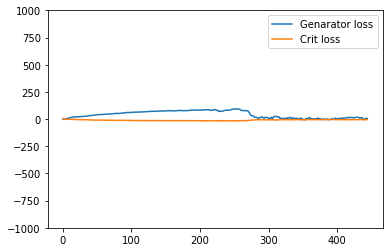

Saving checkpoint: 400 40
save checkpoint


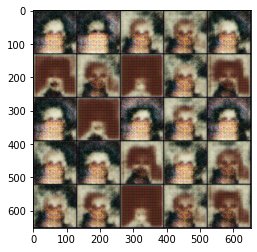

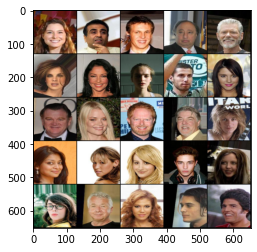

Epoch:4, Step: 400, Genarator loss: 7.198515786230564,critic loss: -4.9521724700927745


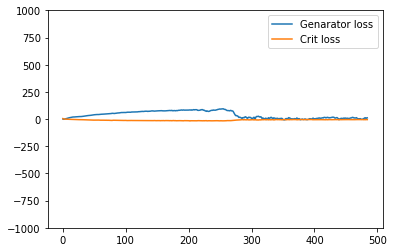

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint: 440 40
save checkpoint


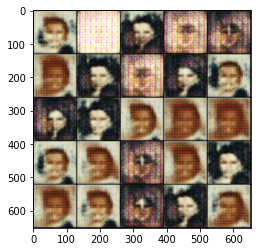

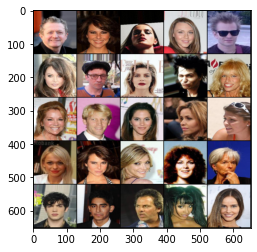

Epoch:5, Step: 440, Genarator loss: 8.43571327663958,critic loss: -4.38181757926941


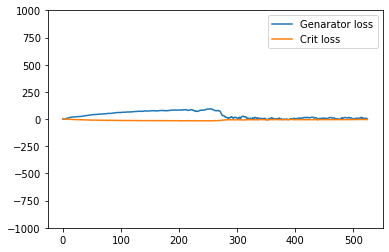

Saving checkpoint: 480 40
save checkpoint


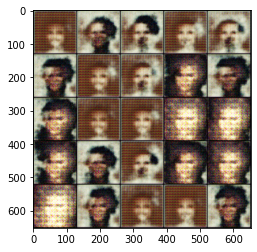

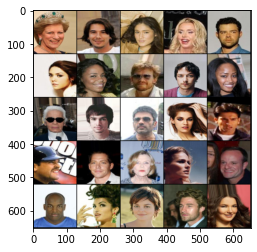

Epoch:5, Step: 480, Genarator loss: 8.9461045473814,critic loss: -4.585855627059936


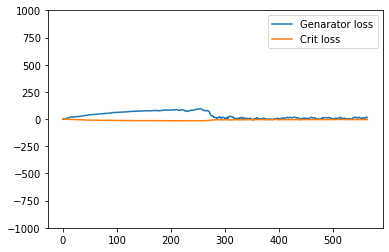

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint: 520 40
save checkpoint


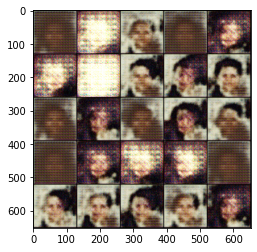

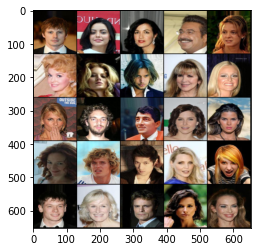

Epoch:6, Step: 520, Genarator loss: 15.57770894765854,critic loss: -4.857948112487794


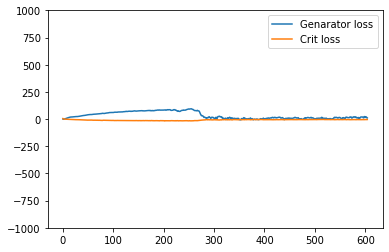

Saving checkpoint: 560 40
save checkpoint


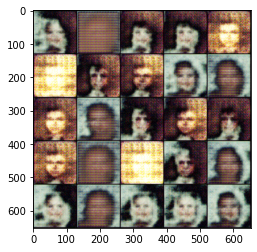

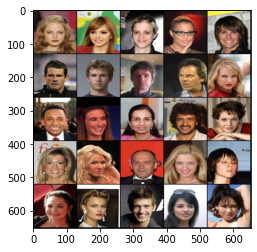

Epoch:6, Step: 560, Genarator loss: 8.17727562636137,critic loss: -4.1146316051483165


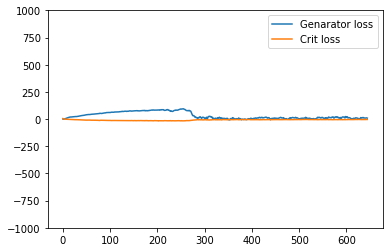

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint: 600 40
save checkpoint


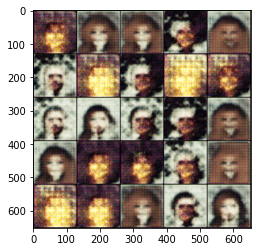

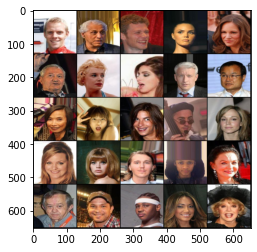

Epoch:7, Step: 600, Genarator loss: 9.271081972122193,critic loss: -3.7552373361587525


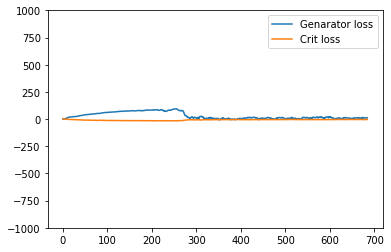

Saving checkpoint: 640 40
save checkpoint


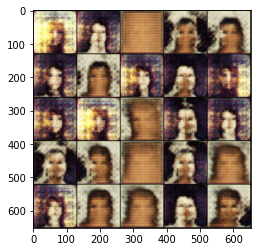

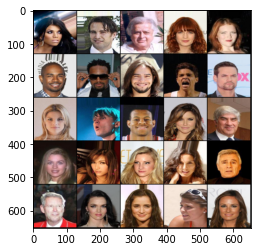

Epoch:7, Step: 640, Genarator loss: 11.622617733478545,critic loss: -3.921819829940796


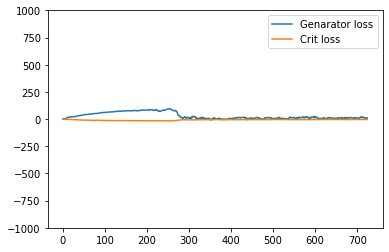

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint: 680 40
save checkpoint


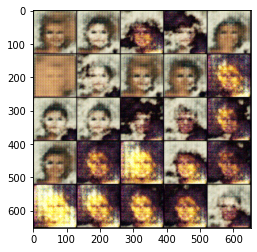

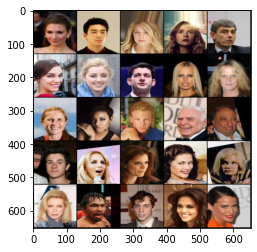

Epoch:8, Step: 680, Genarator loss: 10.988979595899583,critic loss: -4.081326022148133


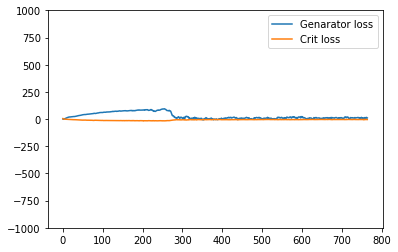

Saving checkpoint: 720 40
save checkpoint


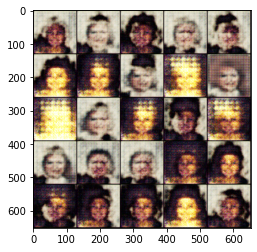

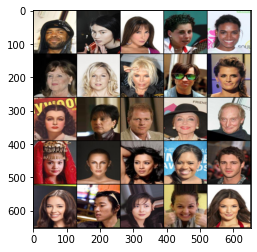

Epoch:8, Step: 720, Genarator loss: 10.83041945695877,critic loss: -3.8478053331375106


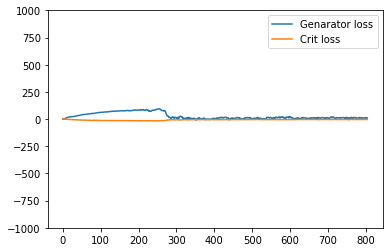

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint: 760 40
save checkpoint


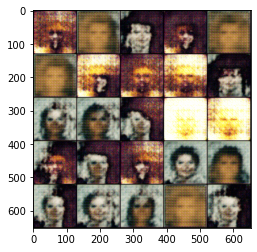

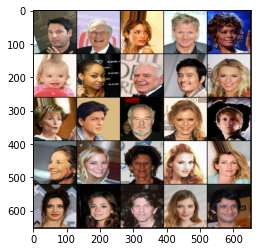

Epoch:9, Step: 760, Genarator loss: 8.172497694194316,critic loss: -3.6798610067367554


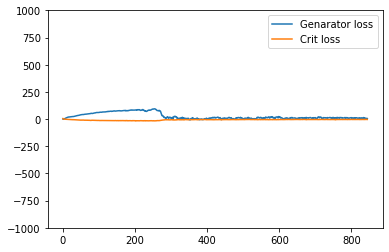

Saving checkpoint: 800 40
save checkpoint


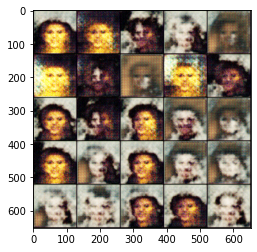

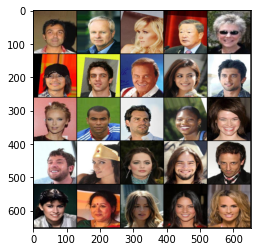

Epoch:9, Step: 800, Genarator loss: 12.144779622554779,critic loss: -3.672730693817138


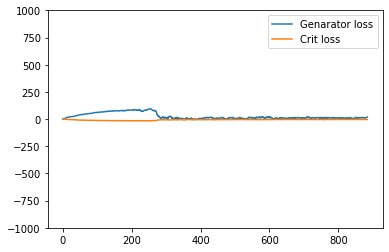

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint: 840 40
save checkpoint


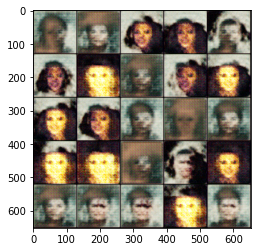

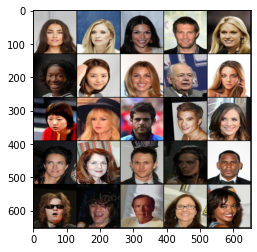

Epoch:10, Step: 840, Genarator loss: 12.380236601829528,critic loss: -3.5720609235763545


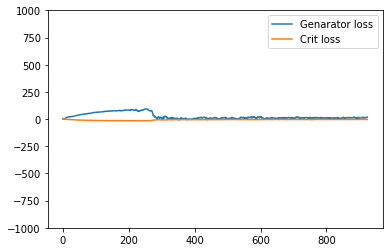

Saving checkpoint: 880 40
save checkpoint


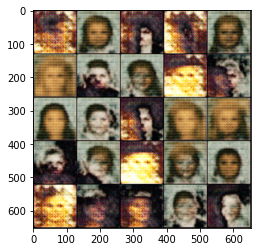

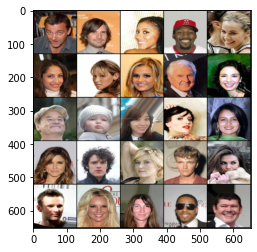

Epoch:10, Step: 880, Genarator loss: 9.66575047969818,critic loss: -3.429164118766784


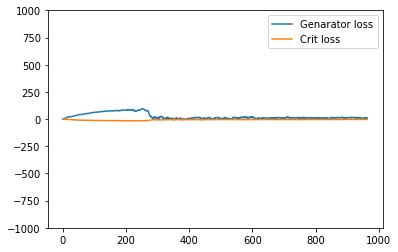

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint: 920 40
save checkpoint


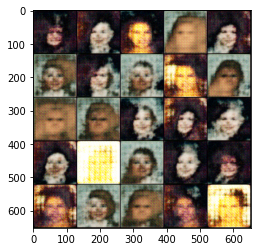

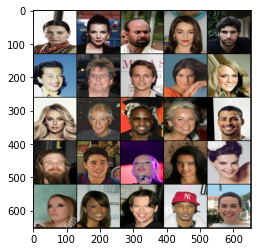

Epoch:11, Step: 920, Genarator loss: 11.130574071407318,critic loss: -3.2158193063735965


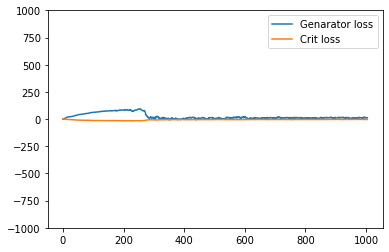

Saving checkpoint: 960 40
save checkpoint


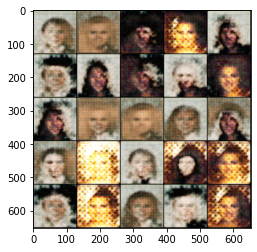

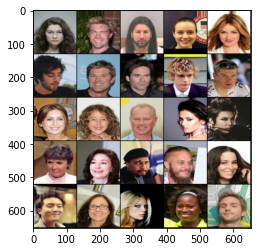

Epoch:11, Step: 960, Genarator loss: 11.210051560401917,critic loss: -3.156120729446411


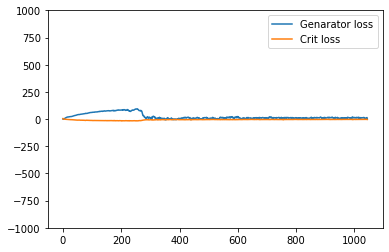

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint: 1000 40
save checkpoint


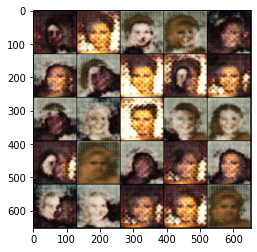

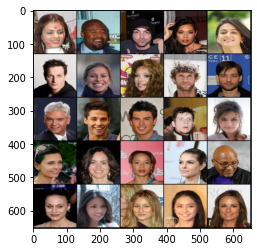

Epoch:12, Step: 1000, Genarator loss: 10.15294270515442,critic loss: -3.1244508171081544


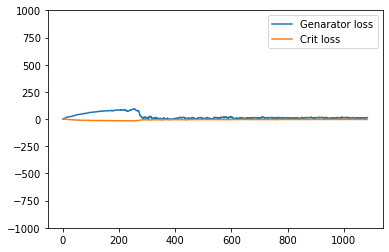

Saving checkpoint: 1040 40
save checkpoint


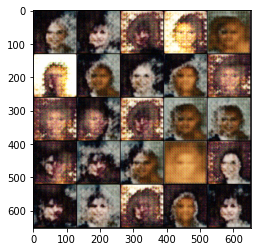

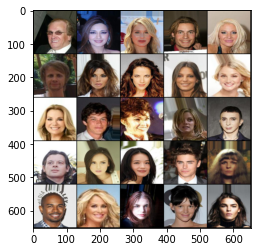

Epoch:12, Step: 1040, Genarator loss: 11.866890919208526,critic loss: -3.194281568527222


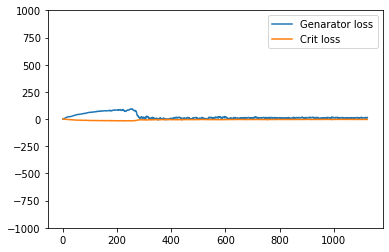

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint: 1080 40
save checkpoint


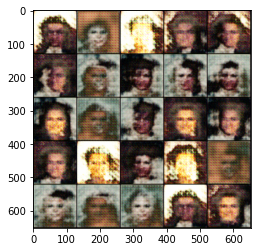

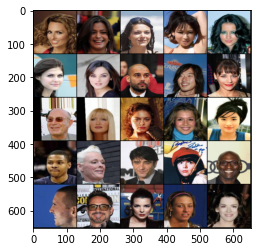

Epoch:13, Step: 1080, Genarator loss: 12.570365381240844,critic loss: -3.19687310218811


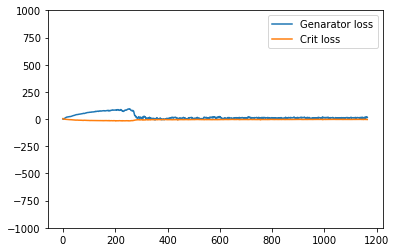

Saving checkpoint: 1120 40
save checkpoint


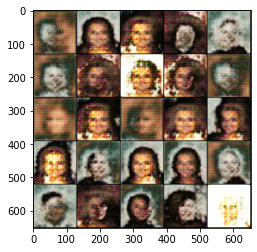

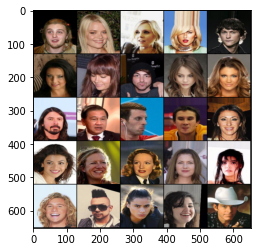

Epoch:13, Step: 1120, Genarator loss: 11.988157701492309,critic loss: -3.20903615474701


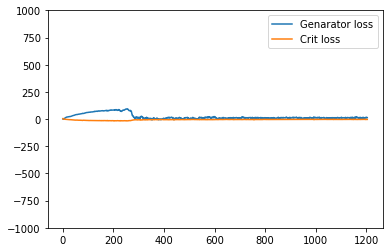

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint: 1160 40
save checkpoint


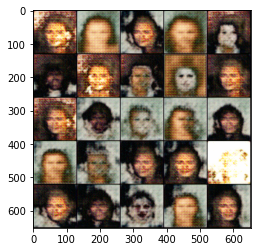

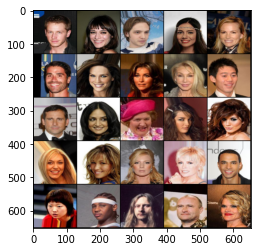

Epoch:14, Step: 1160, Genarator loss: 11.104911339282989,critic loss: -3.033162503242492


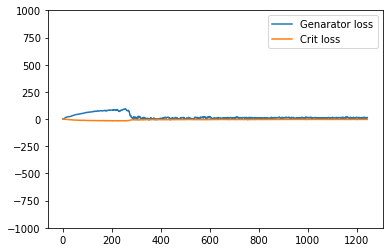

Saving checkpoint: 1200 40
save checkpoint


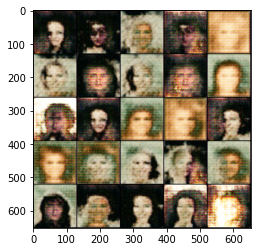

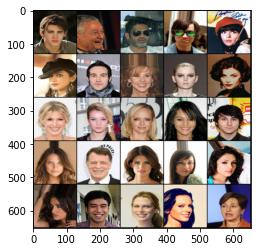

Epoch:14, Step: 1200, Genarator loss: 12.431894159317016,critic loss: -3.082723784446716


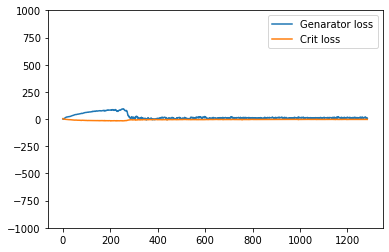

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint: 1240 40
save checkpoint


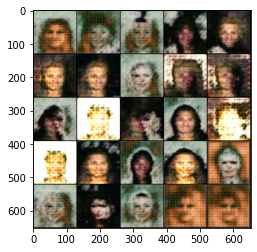

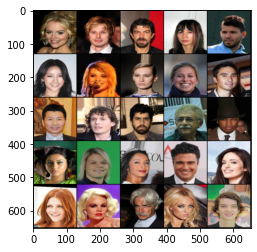

Epoch:15, Step: 1240, Genarator loss: 11.637270557880402,critic loss: -2.9303153657913215


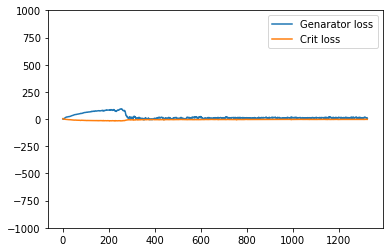

Saving checkpoint: 1280 40
save checkpoint


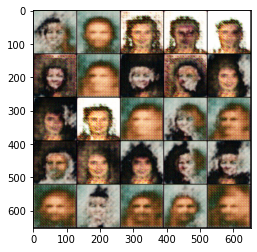

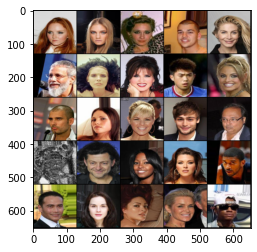

Epoch:15, Step: 1280, Genarator loss: 12.368305504322052,critic loss: -2.8815493774414054


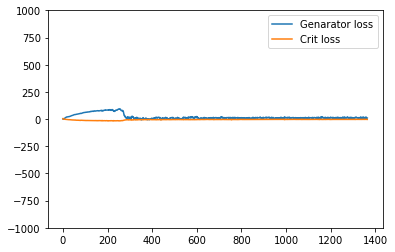

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint: 1320 40
save checkpoint


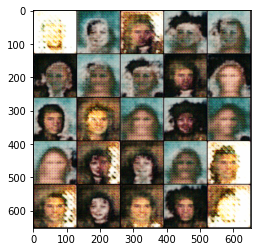

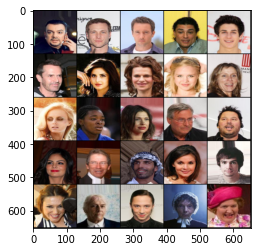

Epoch:16, Step: 1320, Genarator loss: 13.693322920799256,critic loss: -2.9107672977447514


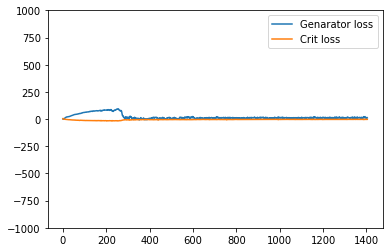

In [ ]:
## Training loop

for epoch in range(n_epochs):
  for real, _ in tqdm(dataloader):
    cur_bs = len(real)
    real = real.to(device)

    ##CRITIC
    mean_crit_loss = 0
    for _ in range(crit_cycles):
      crit_opt.zero_grad()
      noise = gen_noise(cur_bs,z_dim)
      fake = gen(noise)
      crit_fake_pred = crit(fake.detach())
      crit_real_pred = crit(real)

      alpha = torch.rand(len(real),1,1,1,device=device,requires_grad=True) #128x1x1x1
      gp = get_gp(real,fake.detach(),crit,alpha)
      
      crit_loss = crit_fake_pred.mean() - crit_real_pred.mean()+ gp

      mean_crit_loss = crit_loss.item()/crit_cycles

      crit_loss.backward(retain_graph=True)

      crit_opt.step()

    crit_losses += [mean_crit_loss]

    ## Generator

    gen_opt.zero_grad()
    noise= gen_noise(cur_bs,z_dim)
    fake= gen(noise)
    crit_fake_pred = crit(fake)
    
    gen_loss = -crit_fake_pred.mean()
    gen_loss.backward()
    gen_opt.step()

    gen_losses += [gen_loss.item()]

    ## Stats

    if(wandb==1):
      wandb.log({'Epoch':epoch,
                 'Step':step,'Critic_loss':mean_crit_loss,'Gen loss':gen_loss})
    
    if cur_step % save_step == 0 and cur_step>0:
      print("Saving checkpoint:",cur_step,save_step)
      save_checkpoint("latest") 

    if(cur_step % show_step==0 and cur_step>0):
      show(fake,wandbactive=1,name='fake')
      show(real,wandbactive=1,name='real')
      gen_mean = sum(gen_losses[-show_step:])/show_step
      crit_mean = sum(crit_losses[-show_step:])/show_step
      print(f"Epoch:{epoch}, Step: {cur_step}, Genarator loss: {gen_mean},critic loss: {crit_mean}")

      plt.plot(
        range(len(gen_losses)),
        torch.Tensor(gen_losses),
        label="Genarator loss"
      )

      plt.plot(
        range(len(gen_losses)),
        torch.Tensor(crit_losses),
        label="Crit loss"
      )

      plt.ylim(-1000,1000)
      plt.legend()
      plt.show()

    cur_step+=1